In [69]:
from gpt import GPTClient
from instructions import gqa, imgedit
from modules import Seg, Select, ColorPop, Result, FaceDet, Count, Eval, Loc, BGBlur, Crop, Emoji
from visprog import VisProg
from PIL import Image

In [91]:
gpt = GPTClient()

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [3]:
gqa_factory = gqa.get_prompt_factory(method='random', num_prompts=8)
imgedit_factory = imgedit.get_prompt_factory(method='random', num_prompts=8)

In [34]:
seg = Seg(device='cpu')
select = Select(seg.model.config.id2label, seg.model.config.label2id, device='cpu')
colorpop = ColorPop()
result_ = Result()
facedet = FaceDet(device='cpu')
count = Count()
eval_ = Eval()
loc = Loc(device='cpu', threshold=0.08)
bgblur = BGBlur()
crop = Crop()
emoji = Emoji()

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.


preprocessor_config.json:   0%|          | 0.00/392 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/775 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.42k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/613M [00:00<?, ?B/s]

In [113]:
modules = [seg, select, colorpop, result_, facedet, count, eval_, loc, bgblur, crop, emoji]

In [114]:
imgedit_visprog = VisProg(imgedit_factory, gpt, modules)
gqa_visprog = VisProg(gqa_factory, gpt, modules)

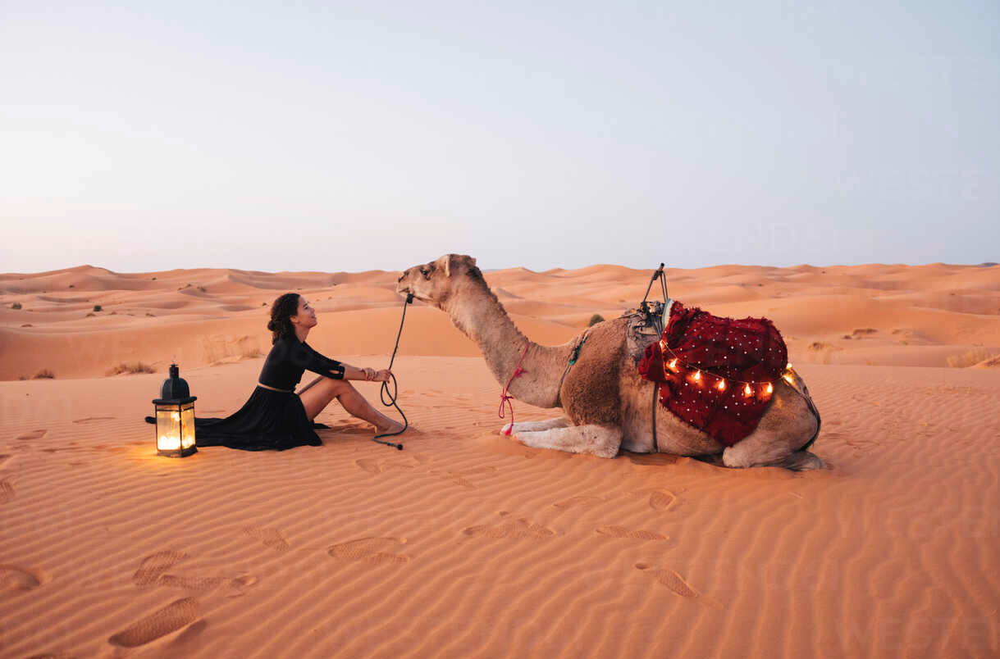

In [7]:
image = Image.open('assets/camel1.png').convert('RGB')
image

In [8]:
initial_state = {
  'IMAGE': image,
}

In [9]:
steps, result = imgedit_visprog.run(initial_state, instruction='Create a colorpop of the camel and the woman.')

In [10]:
steps

['OBJ0=SEG(image=IMAGE)',
 "OBJ1=SELECT(image=IMAGE, object=OBJ0, query='camel,woman', category=None)",
 'IMAGE0=COLORPOP(image=IMAGE, object=OBJ1)',
 'FINAL_RESULT=RESULT(var=IMAGE0)']

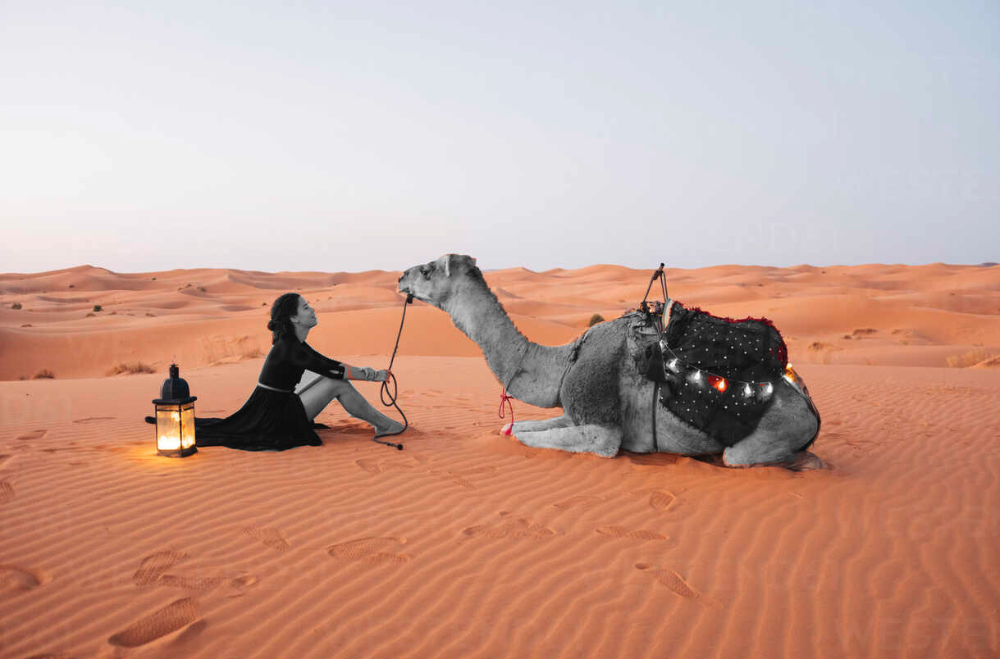

In [14]:
result.output['var'].convert('RGB')

In [58]:
steps, result = imgedit_visprog.run(initial_state, seed=43,
                                    instruction='Select the camel and the woman and blur the background.')

In [59]:
steps

['OBJ0=SEG(image=IMAGE)',
 "OBJ1=SELECT(image=IMAGE,object=OBJ0,query='camel,woman',category=None)",
 'IMAGE0=BGBLUR(image=IMAGE,object=OBJ1)',
 'FINAL_RESULT=RESULT(var=IMAGE0)']

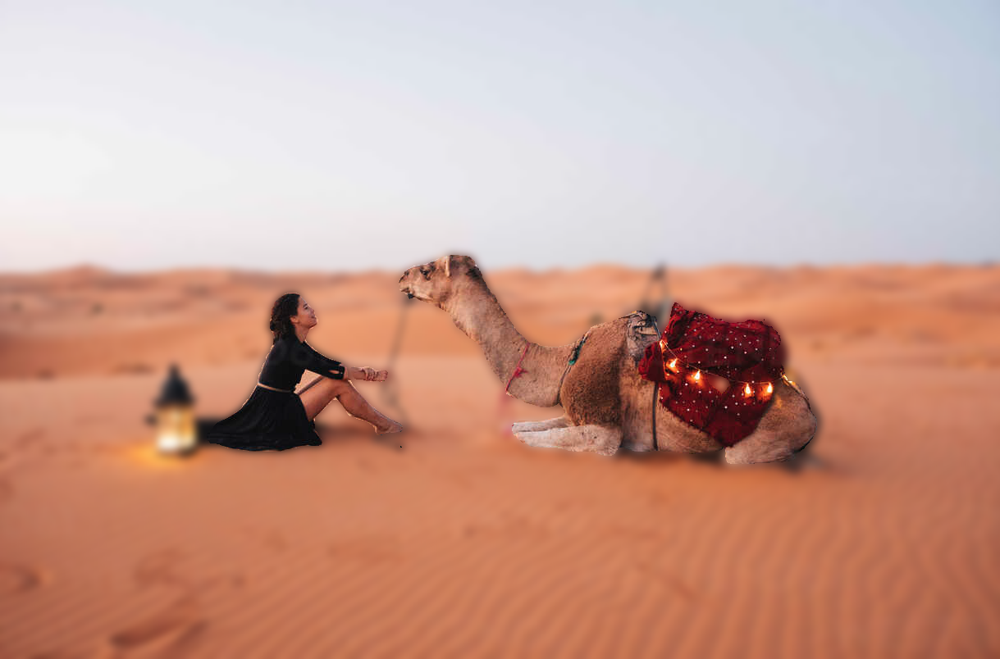

In [60]:
result.output['var']

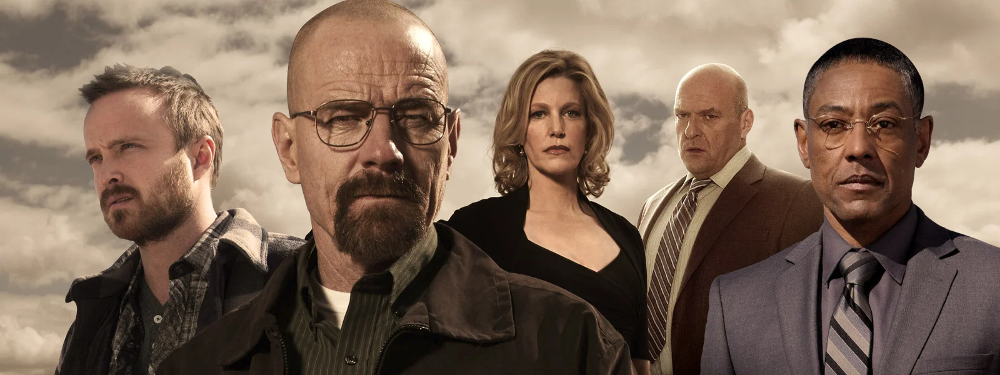

In [65]:
breaking_bad = Image.open('assets/BreakingBad.webp').convert('RGB')
breaking_bad

In [66]:
initial_state = {
  'IMAGE': breaking_bad,
}

In [73]:
steps, result = imgedit_visprog.run(initial_state, seed=44,
                                    instruction='Hide the face of Walter White and Skyler White with 8) and :p')

In [74]:
steps

['OBJ0=FACEDET(image=IMAGE)',
 "OBJ1=SELECT(image=IMAGE,object=OBJ0,query='Walter White',category=None)",
 "IMAGE0=EMOJI(image=IMAGE,object=OBJ1,emoji='smiling_face_with_sunglasses')",
 "OBJ2=SELECT(image=IMAGE,object=OBJ0,query='Skyler White',category=None)",
 "IMAGE1=EMOJI(image=IMAGE0,object=OBJ2,emoji='face_with_tongue')",
 'FINAL_RESULT=RESULT(var=IMAGE1)']

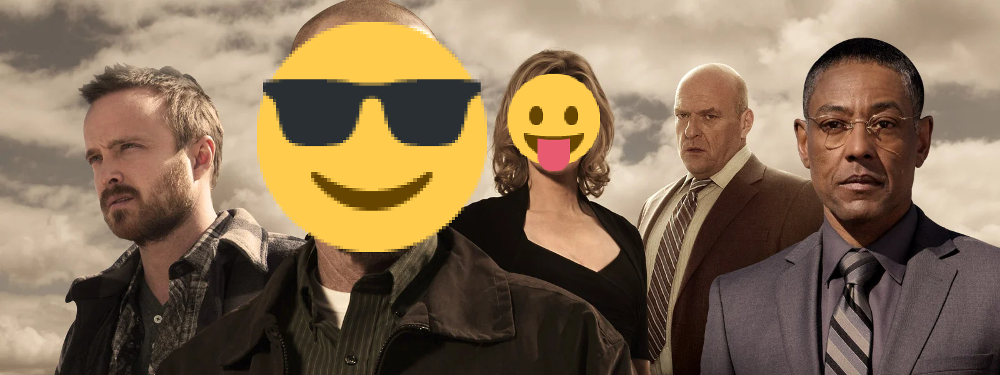

In [75]:
result.output['var']

OBJ0=FACEDET(image=IMAGE)


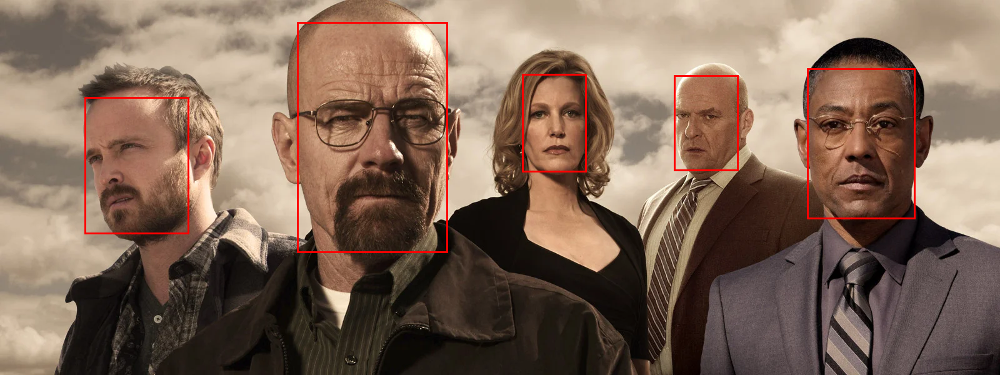

In [83]:
print(steps[0])
result.step_details[0]['image_with_bbox']

OBJ1=SELECT(image=IMAGE,object=OBJ0,query='Walter White',category=None)


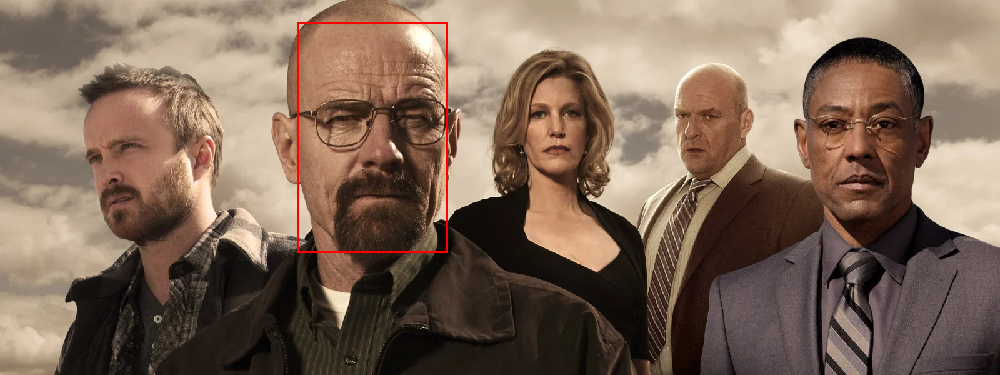

In [84]:
print(steps[1])
result.step_details[1]['output']

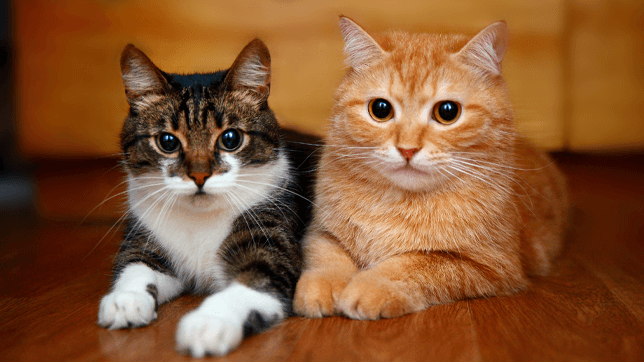

In [95]:
cats = Image.open('assets/cats.webp').convert('RGB')
cats

In [96]:
initial_state = {
  'IMAGE': cats,
}

In [109]:
steps, result = gqa_visprog.run(initial_state, seed=45,
                                question='Are there at least 2 cats in the image?')

In [110]:
steps

["BOX0=LOC(image=IMAGE, object='cat')",
 'ANSWER0=COUNT(box=BOX0)',
 'ANSWER1=EVAL(expr="\'yes\' if {ANSWER0} >= 2 else \'no\'")',
 'FINAL_RESULT=RESULT(var=ANSWER1)']

In [117]:
result.output['var']

'yes'